# Data Collation

In this notebook I will extract 50 recordings for 10 distinctly different sounding british birds.

The 10 birds I've chosen are:

In [1]:
birds = [
    ("Fringilla", "coelebs"),  # Chaffinch
    ("Parus", "major"),  # Great Tit
    ("Turdus", "merula"),  # Blackbird
    ("Erithacus", "rubecula"),  # Robin
    ("Columba", "palumbus"),  # Wood Pigeon
    ("Turdus", "philomelos"),  # Song Thrush
    ("Cyanistes", "caeruleus"),  # Blue Tit
    ("Cuculus", "canorus"),  # Cuckoo
    ("Troglodytes", "troglodytes"),  # Wren
    ("Sylvia", "atricapilla")  # Eurasian Blackcap
]

First we must install and import required packages

In [2]:
# %pip install requests librosa matplotlib

import requests
import time
import json
import os
import librosa
import IPython.display as ipd
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

Write a function that calls the xeno-canto api to get a list of recording ids for a given bird

In [3]:
BASE_URL = 'https://xeno-canto.org/api/2/recordings?query='

last_call = None  # Used to prevent calling the API too frequently. Limit is 1 per second.

def call_api(query: dict, last_call=last_call):
    """Call the xeno-canto API with the given query parameters."""
        
    # Build the query string
    params = ['grp:"birds"']
    for key, val in query.items():
        params.append(f'{key}:"{val}"')
    param_str = ' '.join(params)
    
    # Check if cached already
    cache_str = param_str.replace(" ", "").replace('"', "").replace(":", "")
    if os.path.exists(f"./data/api_cache/{cache_str}.json"):
        with open(f"./data/api_cache/{cache_str}.json", 'r') as f:
            cached_data = json.loads(f.read())
            return {
                'numRecordings': cached_data['numRecordings'],
                'recordings': cached_data['recordings']
            }
    
    # Ensure has been longer than 1 second since last call
    if last_call is not None:
        time_since_last_call = time.time() - last_call
        if time_since_last_call < 1:
            time.sleep(1 - time_since_last_call)
    
    # Call the API
    print("Calling the api")
    res = requests.get(BASE_URL + param_str)
    json_data = res.json()
    last_call = time.time()  # Update last call time
    
    # Cache response
    CACHE_PATH = './data/api_cache'
    with open(f"{CACHE_PATH}/{cache_str}.json", 'w') as f:
        f.write(json.dumps(json_data))
    
    return {
        'numRecordings': json_data['numRecordings'],
        'recordings': json_data['recordings']
    }
    
res = call_api({
    'gen': 'fringilla',
    'ssp': 'coelebs'
})

print("Number of recordings:", res['numRecordings'])

print(json.dumps(res, indent=2))

Number of recordings: 1657
{
  "numRecordings": "1657",
  "recordings": [
    {
      "id": "900826",
      "gen": "Fringilla",
      "sp": "coelebs",
      "ssp": "coelebs",
      "group": "birds",
      "en": "Common Chaffinch",
      "rec": "Fernando Portillo de Cea",
      "cnt": "Spain",
      "loc": "Monfrag\u00fce (near  Torrej\u00f3n el Rubio), C\u00e1ceres, Extremadura",
      "lat": "39.8279",
      "lng": "-6.0577",
      "alt": "260",
      "type": "song",
      "sex": "male",
      "stage": "adult",
      "method": "field recording",
      "url": "//xeno-canto.org/900826",
      "file": "https://xeno-canto.org/900826/download",
      "file-name": "XC900826-551787991.wav",
      "sono": {
        "small": "//xeno-canto.org/sounds/uploaded/ECFTPWPHMZ/ffts/XC900826-small.png",
        "med": "//xeno-canto.org/sounds/uploaded/ECFTPWPHMZ/ffts/XC900826-med.png",
        "large": "//xeno-canto.org/sounds/uploaded/ECFTPWPHMZ/ffts/XC900826-large.png",
        "full": "//xeno-canto.

Write a load audio function that loads a saved audio file and returns its y values and sample rate.

In [5]:
BASE_PATH = 'data/bird_recordings'
SAMPLE_RATE = 16000

def load_audio(id: int):
    return librosa.load(f'{BASE_PATH}/{id}', sr=SAMPLE_RATE)

The following function loads the file from storage if already save, otherwise, downloads it from xeno-canto.org

In [6]:
def download_audio(id: int):
    """Downloads the audio file with the given id from xeno-canto.org"""
    
    # Construct the file path
    file_path = f'{BASE_PATH}/{id}'
    
    # If file already exists, return it
    if os.path.exists(file_path):
        return load_audio(id)
    
    # Make a request to download the file
    print(f"Downloading file with id {id}")
    res = requests.get(f'https://xeno-canto.org/{id}/download')
    if res.status_code == 200:
        # Open the file in write-binary mode and save the content
        with open(file_path, "wb") as file:
            file.write(res.content)
        print(f"File saved successfully as {file_path}")
        return load_audio(id)
    else:
        print(f"Request failed with status code {res.status_code}")
        raise Exception(f"Failed to download file with id {id}")

Testing the above code

In [8]:
y, sr = download_audio('622073')

ipd.display(ipd.Audio(y, rate=sr))

In [9]:
def get_bird_recordings(bird: tuple):
    """Get bird recordings for the given bird species"""
    
    data = call_api({
        'gen': bird[0],
        'ssp': bird[1]
    })
    
    print(f"{bird[0]} {bird[1]}: {data['numRecordings']} recordings")
    
    return data['recordings']

I've selected 10 british birds that have distinct calls that will be easy to tell apart from each other. This will make training an initial model a bit easier.

In [15]:
rows = []
    
for bird in birds:
    recordings = get_bird_recordings(bird)
    recordings = [
        {
            'id': recording['id'],
            'genus': recording['gen'],
            'subspecies': recording['ssp'],
            'name': recording['en'],
            'country': recording['cnt'],
            'quality': recording['q'],
            'latitude': recording['lat'],
            'longitude': recording['lng']
            
        } for recording in recordings[:50]
    ]
    for recording in recordings:
        download_audio(recording['id'])
    rows.extend(recordings)
    
df = pd.DataFrame(rows)
    
df['subspecies'].value_counts()

df.to_csv('data/bird_recordings.csv', index=False)

Fringilla coelebs: 1657 recordings
Parus major: 479 recordings
Turdus merula: 1209 recordings
Erithacus rubecula: 185 recordings
Columba palumbus: 117 recordings
Turdus philomelos: 215 recordings
Cyanistes caeruleus: 165 recordings
Cuculus canorus: 110 recordings
Troglodytes troglodytes: 809 recordings
Sylvia atricapilla: 656 recordings


Display spectograms for each species.

Fringilla coelebs
File saved successfully as data/bird_recordings/120942
File saved successfully as data/bird_recordings/905885
File saved successfully as data/bird_recordings/396978


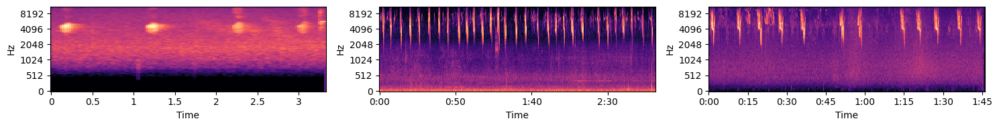

Parus major
File saved successfully as data/bird_recordings/298049
File saved successfully as data/bird_recordings/492542


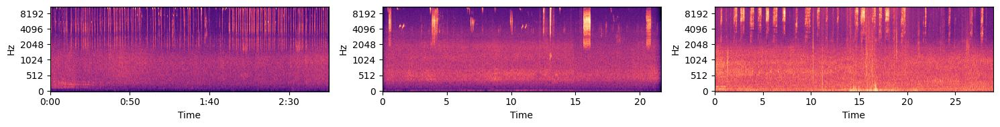

Turdus merula
File saved successfully as data/bird_recordings/25745
File saved successfully as data/bird_recordings/312910
File saved successfully as data/bird_recordings/406853


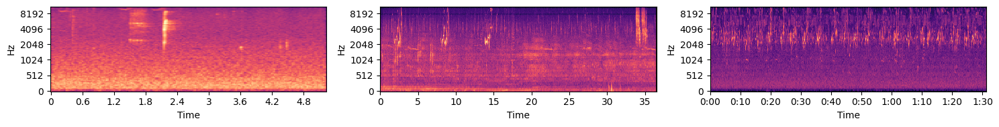

Erithacus rubecula
File saved successfully as data/bird_recordings/333212
File saved successfully as data/bird_recordings/315480


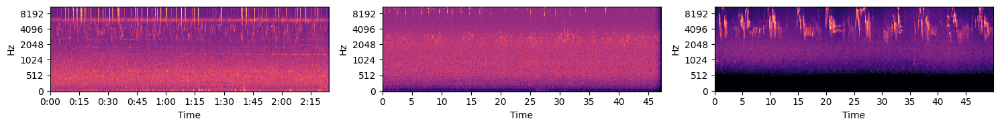

Columba palumbus
File saved successfully as data/bird_recordings/341669
File saved successfully as data/bird_recordings/612896


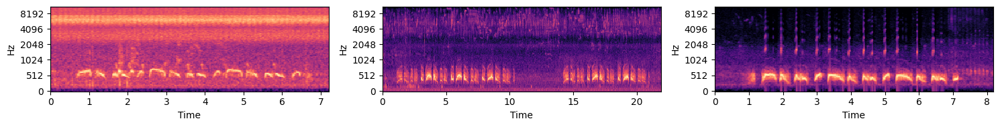

Turdus philomelos
File saved successfully as data/bird_recordings/635047


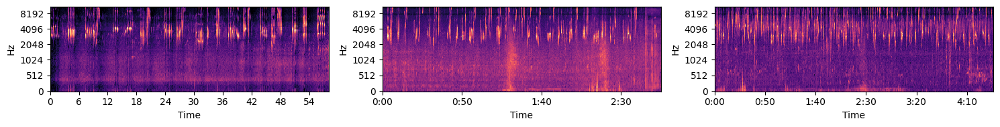

Cyanistes caeruleus
File saved successfully as data/bird_recordings/475455
File saved successfully as data/bird_recordings/360587
File saved successfully as data/bird_recordings/72781


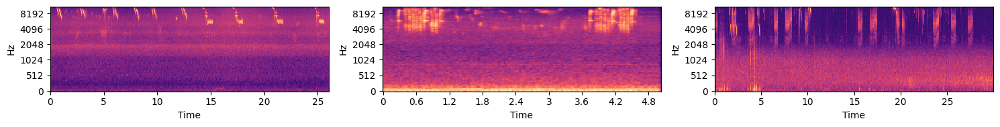

Cuculus canorus


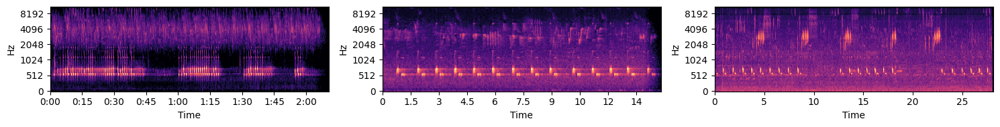

Troglodytes troglodytes
File saved successfully as data/bird_recordings/522104
File saved successfully as data/bird_recordings/809147


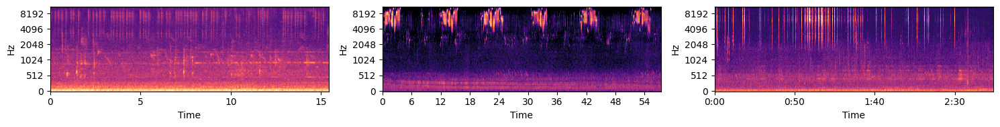

Sylvia atricapilla
File saved successfully as data/bird_recordings/923868
File saved successfully as data/bird_recordings/766326
File saved successfully as data/bird_recordings/796315


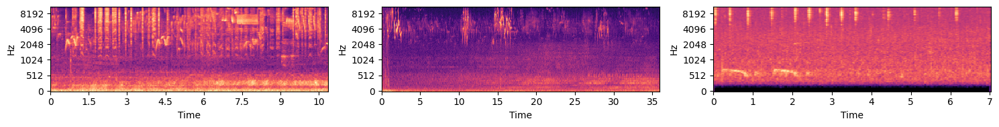

In [13]:
df = pd.read_csv('data/bird_recordings.csv')

for bird in birds:
    gen, ssp = bird
    print(f"{gen} {ssp}")
    samples = df[(df['genus'] == gen) & (df['subspecies'] == ssp)].sample(3)
    plt.figure(figsize=(15, 2))
    idx = 1
    for s_idx in samples.index:
        sample = samples.loc[s_idx]
        y, sr = download_audio(sample['id'])
        spectrogram = librosa.feature.melspectrogram(y=y, sr=sr)
        plt.subplot(1, 3, idx)
        librosa.display.specshow(librosa.power_to_db(spectrogram, ref=np.max), y_axis='mel', x_axis='time')
        idx += 1
    plt.tight_layout()
    plt.show()

Above I have shown 3 spectograms (side-by-side) for each of the 10 birds. I've done this for two reasons:

1. To guage similarity between recordings of the same bird
2. To guage how distinct each bird is from other speciies

It is certainly possible to see some similarity between different recordings, and also to tell different birds apart. E.g. Cuculus Canorus (cuckoo bird) and the Erithacus rubecula sit in completely different frequency ranges with different melodies, and rhythms. It is quite easy to tell these two apart.

However, take troglodytes for example. It is very hard to see discernible pattern between each recording.

Part of the problem is all the recordings have different lengths.

Ways to identify a bird:

- **Spectral centroid**: indicates where the center of mass of the spectrum is located
- **Spectral spread**: describes the average deviation of the rate-map around its centroid, which is commonly associated with the bandwidth of the signal
- **Rhythm and spacing**: clusters of 3 followed by long gaps? constant rhythm? no spaces?
- **Melodies**: i.e. spectral centroid over time?

My current thoughts are that you'd probably get the best results from using a combination of models.

- A recurrent neural network (RNN) such as an LSTM may be well suited to analying audio over time
- A convolutional neural network (CNN) may be well suited to analysing snapshots of spectrograms.
- K nearest neighbour models may be appropriate for analysing characteristics

A FFT (Fast Fourier Transform) allows us to get insights into the frequency content of the entire audio signal.

This is useful in our case, as the recordings all have drastically different lengths. But FFT removes the time domain and simplifiy considers magnitudes of frequencies.

Below I have calculated some FFTs for each of our bird species. 

In [35]:
df = pd.read_csv('data/bird_recordings.csv')

for bird in birds:
    gen, ssp = bird
    print(f"\n{gen} {ssp}")
    
    samples = df[(df['gen'] == gen) & (df['ssp'] == ssp)].sample(10)
    
    avg_spectral_centroids = []
    avg_spectral_bandwidths = []
    
    for i in samples.index:
        sample = samples.loc[i]
        
        # Load audio file
        y, sr = download_audio(sample['id'])
        
        avg_spectral_centroids.append(np.mean(librosa.feature.spectral_centroid(y=y, sr=sr)))
        avg_spectral_bandwidths.append(np.mean(librosa.feature.spectral_bandwidth(y=y, sr=sr))) 
        
    print(f"Average Spectral Centroid: {np.mean(avg_spectral_centroids)}, (SD: {np.std(avg_spectral_centroids)})")
    print(f"Average Spectral Bandwidth: {np.mean(avg_spectral_bandwidths)}, (SD: {np.std(avg_spectral_bandwidths)})")   


Fringilla coelebs
Average Spectral Centroid: 2920.7201072711628, SD: 712.9119873871102
Average Spectral Bandwidth: 1680.518597575658, SD: 203.6346708270097

Parus major
Average Spectral Centroid: 2825.7337667900038, SD: 789.7889525036861
Average Spectral Bandwidth: 1743.6349241013436, SD: 242.65294753572326

Turdus merula
Average Spectral Centroid: 2177.9111958667954, SD: 556.9694995625458
Average Spectral Bandwidth: 1492.7366871425104, SD: 147.212621135505

Erithacus rubecula
Average Spectral Centroid: 2724.4704272125455, SD: 861.1235083219412
Average Spectral Bandwidth: 1568.9736521910236, SD: 476.53004918922346

Columba palumbus
Average Spectral Centroid: 1888.301938803017, SD: 748.3810891829924
Average Spectral Bandwidth: 1753.3141263218088, SD: 240.06530872047517

Turdus philomelos
Average Spectral Centroid: 2853.9084066782366, SD: 407.54111303762295
Average Spectral Bandwidth: 1646.2625953448946, SD: 122.87204757837348

Cyanistes caeruleus
Average Spectral Centroid: 3622.9458832


Fringilla coelebs


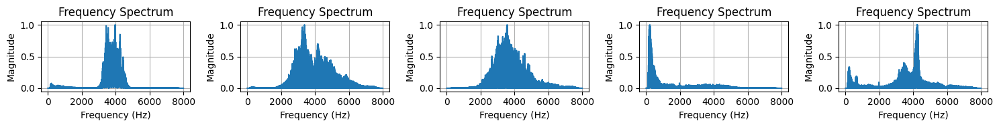


Parus major


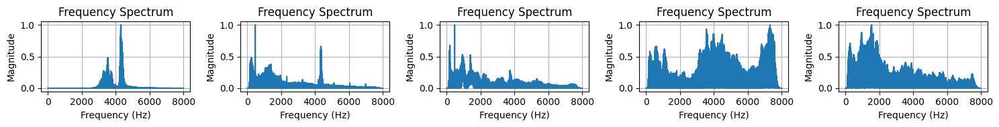


Turdus merula


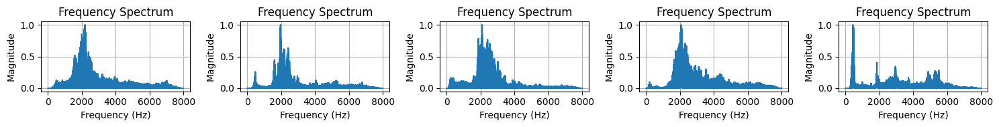


Erithacus rubecula


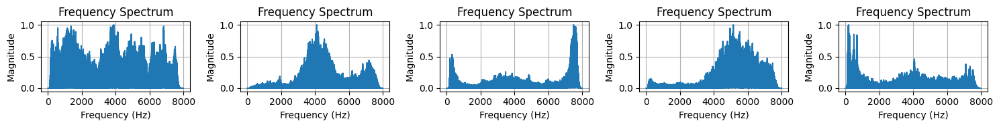


Columba palumbus


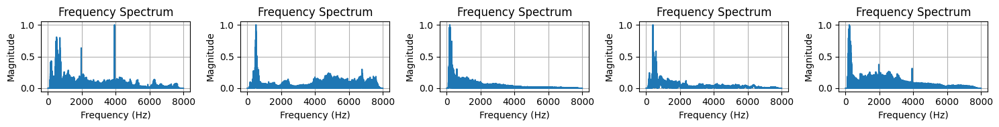


Turdus philomelos


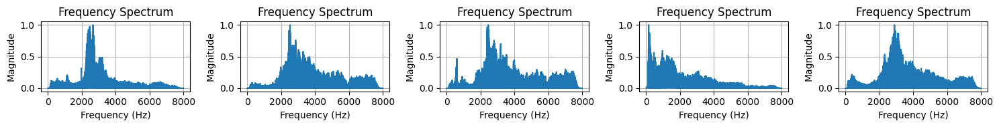


Cyanistes caeruleus


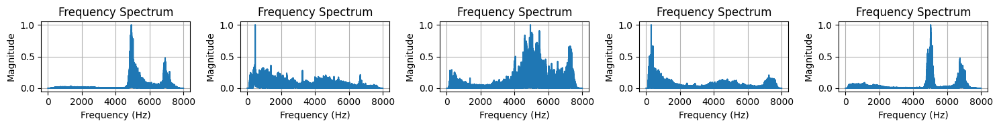


Cuculus canorus


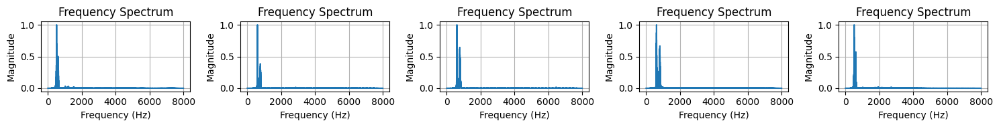


Troglodytes troglodytes


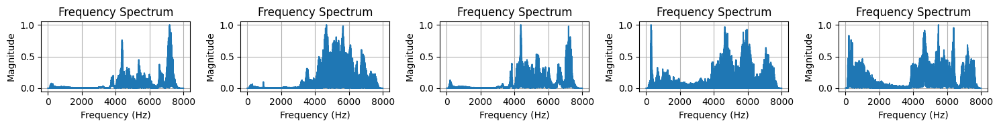


Sylvia atricapilla


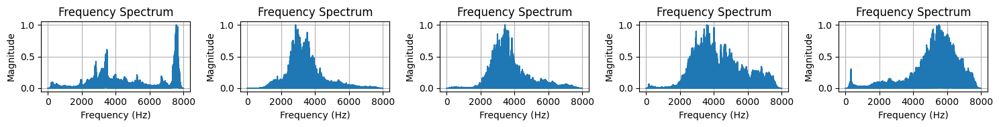

In [24]:
from scipy.signal import butter, filtfilt

df = pd.read_csv('data/bird_recordings.csv')

# Define a high-pass filter
def butter_highpass(cutoff, sr, order=5):
    nyquist = 0.5 * sr
    normal_cutoff = cutoff / nyquist
    b, a = butter(order, normal_cutoff, btype='high', analog=False)
    return b, a


def highpass_filter(data, cutoff, sr, order=5):
    b, a = butter_highpass(cutoff, sr, order=order)
    y_filtered = filtfilt(b, a, data)
    return y_filtered

# Set cutoff frequency in Hz
cutoff_frequency = 150  # 150 Hz

for bird in birds:
    gen, ssp = bird
    print(f"\n{gen} {ssp}")

    samples = df[(df['gen'] == gen) & (df['ssp'] == ssp)].sample(5)
    plt.figure(figsize=(15, 2))
    idx = 1
    
    for s_idx in samples.index:
        sample = samples.loc[s_idx]
        
        # Load audio file
        y, sr = download_audio(sample['id'])
        
        plt.subplot(1, 5, idx)
    
        # Apply the high-pass filter
        y_filtered = highpass_filter(y, cutoff_frequency, sr)
        
        # Perform the FFT
        fft_result = np.fft.fft(y_filtered)
        
        # Get the frequency values corresponding to the FFT result
        frequencies = np.fft.fftfreq(len(fft_result), 1/sr)
        
        # Since the FFT result is symmetrical, we take only the positive half
        magnitude = np.abs(fft_result)
        frequencies = frequencies[:len(frequencies)//2]
        magnitude = magnitude[:len(magnitude)//2]
        
        # Normalize the magnitudes to a range of 0 to 1
        magnitude = magnitude / np.max(magnitude)
        
        plt.plot(frequencies, magnitude)
        plt.xlabel('Frequency (Hz)')
        plt.ylabel('Magnitude')
        plt.title('Frequency Spectrum')
        plt.grid(True)
        
        idx += 1
        
    plt.tight_layout()
    plt.show()

As you can see this is quite a useful feature we can extract.

Each species seems to have fairly distinct and consistent frequency content.

A convolutional neural network may be well suited to analysing this data.